# ☀️ Imports and Setup

In [2]:
import torch
print(torch.__version__)

import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics YOLOv8.0.110 🚀 Python-3.10.10 torch-2.0.0 CUDA:0 (Tesla T4, 15110MiB)
Setup complete ✅ (2 CPUs, 15.6 GB RAM, 4725.8/8062.4 GB disk)


In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import glob
import shutil
import torchvision

from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes
from shutil import copyfile
from pathlib import Path
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from PIL import Image, ImageDraw, ImageFont
from PIL import __version__ as pil_version
from ultralytics.yolo.utils import LOGGER, TryExcept, plt_settings, threaded
from ultralytics.yolo.utils.plotting import *
from scipy.ndimage import gaussian_filter1d

%matplotlib inline

# 🦆 Hyperparameters

In [4]:
TRAIN_PATH = '/kaggle/input/global-wheat-detection/train/'
TEST_PATH = '/kaggle/input/global-wheat-detection/test/'
IMG_SIZE = 1024
BATCH_SIZE = 16
EPOCHS = 100

# 🔨 Prepare Dataset

In [5]:
%cd ../

df = pd.read_csv('/kaggle/input/global-wheat-detection/train.csv')
df['path'] = df.apply(lambda row: TRAIN_PATH+row.image_id+'.jpg', axis=1)
df.head()

/kaggle/input


,image_id,width,height,bbox,source,path
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...


# 🍘 Train-validation split

In [8]:
train_list, valid_list = train_test_split(df.image_id.unique(), test_size=0.2, random_state=1)

In [9]:
len(train_list)

2698

In [10]:
len(valid_list)

675

In [11]:
train_df = df.loc[df.image_id.isin(train_list)]
valid_df = df.loc[df.image_id.isin(valid_list)]

train_df.loc[:, 'split'] = 'train'
valid_df.loc[:, 'split'] = 'valid'

df = pd.concat([train_df, valid_df]).reset_index(drop=True)

/tmp/ipykernel_23/4127551595.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df.loc[:, 'split'] = 'train'
/tmp/ipykernel_23/4127551595.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_df.loc[:, 'split'] = 'valid'


In [12]:
len(train_df), len(valid_df)

(117750, 30043)

In [13]:
df

,image_id,width,height,bbox,source,path,split
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...,train
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...,train
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...,train
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...,train
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,/kaggle/input/global-wheat-detection/train/b6a...,train
...,...,...,...,...,...,...,...
147788,a5c8d5f5c,1024,1024,"[473.0, 637.0, 62.0, 67.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/a5c...,valid
147789,a5c8d5f5c,1024,1024,"[980.0, 207.0, 44.0, 84.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/a5c...,valid
147790,a5c8d5f5c,1024,1024,"[568.0, 348.0, 123.0, 94.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/a5c...,valid
147791,a5c8d5f5c,1024,1024,"[10.0, 806.0, 64.0, 92.0]",arvalis_2,/kaggle/input/global-wheat-detection/train/a5c...,valid


In [14]:
print(f'Size of dataset: {len(df)}, training images: {len(train_df)}. validation images: {len(valid_df)}')

Size of dataset: 147793, training images: 117750. validation images: 30043


In [15]:
%cd ../../
%cd kaggle/working/

os.makedirs('dataset/images/train', exist_ok=True)
os.makedirs('dataset/images/valid', exist_ok=True)
os.makedirs('dataset/images/test', exist_ok=True)

os.makedirs('dataset/labels/train', exist_ok=True)
os.makedirs('dataset/labels/valid', exist_ok=True)
os.makedirs('dataset/labels/test', exist_ok=True)

%cd ../../
!tree kaggle/working/dataset

/
/kaggle/working
/
kaggle/working/dataset
├── images
│   ├── test
│   ├── train
│   └── valid
└── labels
    ├── test
    ├── train
    └── valid

8 directories, 0 files


In [16]:
# Move the images to relevant split folder.
for i in tqdm(range(len(df))):
    row = df.loc[i]
    if row.split == 'train':
        copyfile(row.path, f'kaggle/working/dataset/images/train/{row.image_id}.jpg')
    else:
        copyfile(row.path, f'kaggle/working/dataset/images/valid/{row.image_id}.jpg')

100%|██████████| 147793/147793 [04:54<00:00, 502.56it/s]


In [17]:
# Move the test images to relevant split folder.
# paths
src = 'kaggle/input/global-wheat-detection/test'
trg = 'kaggle/working/dataset/images/test'

files=os.listdir(src)

# iterating over all the files in
# the source directory
for fname in files:
    # copying the files to the
    # destination directory
    shutil.copy2(os.path.join(src,fname), trg)

# 🍜 Create `.YAML` file

In [18]:
%cd kaggle/working/

/kaggle/working


In [19]:
%%writefile dataset.yaml
path: ../../../../../kaggle/working/dataset
train: images/train
val: images/valid
test: images/test

# Classes
names:
    0: none
    1: opacity

Writing dataset.yaml


In [20]:
%cat dataset.yaml

path: ../../../../../kaggle/working/dataset
train: images/train
val: images/valid
test: images/test

# Classes
names:
    0: none
    1: opacity


# 🍮 Prepare Bounding Box Coordinated for YOLOv5

In [21]:
def get_bbox(row):
    bboxes = []
    bbox = []
    list1 = row.bbox.replace("[", "").replace("]","").replace(",","")
    for i in list1.split(" "):
        bboxes.append(float(i))
    return bboxes

In [22]:
# Convert the bounding boxes in YOLO format.
def get_yolo_format_bbox(img_w, img_h, bboxes):
    yolo_boxes = []
    x = bboxes[0]
    y = bboxes[1]
    w = bboxes[2] 
    h = bboxes[3] 
    xc = x + int(w/2) # xmin + width/2
    yc = y + int(h/2) # ymin + height/2
    yolo_boxes=[1, xc/img_w, yc/img_h, w/img_w, h/img_h] # x_center y_center width height
    yolo_boxes = str(yolo_boxes).replace("[", "").replace("]","").replace(",","")
    return yolo_boxes

In [23]:
# Prepare the txt files for bounding box
for i in tqdm(range(len(df))):
    row = df.loc[i]
    # Get image id
    img_id = row.image_id
    # Get split
    split = row.split
    
    if row.split=='train':
        file_name = f'dataset/labels/train/{row.image_id}.txt'
    else:
        file_name = f'dataset/labels/valid/{row.image_id}.txt'
        
    bboxes = get_bbox(row)
        
    # Format for YOLOv5
    yolo_bboxes = get_yolo_format_bbox(IMG_SIZE, IMG_SIZE, bboxes)
        
    with open(file_name, 'a') as f:
        f.write(yolo_bboxes)
        f.write('\n')
    #print(file_name)
    #print(yolo_bboxes)

100%|██████████| 147793/147793 [00:34<00:00, 4257.46it/s]


In [24]:
TRAIN_PATH = 'dataset/images/train'
TRAIN_LABEL_PATH = 'dataset/labels/train'

In [25]:
train_files = os.listdir(TRAIN_LABEL_PATH)
print('Number of test images predicted as opaque: ', len(train_files))

Number of test images predicted as opaque:  2698


In [26]:
def display_images_with_box(num):
    pred = []
    bbox = []
    image_id = []
    k = 1
    plt.figure(figsize=(30,30))
    for i in train_files[:num]:
        with open(f'{TRAIN_LABEL_PATH}/{i}') as f:
            img = read_image(f'{TRAIN_PATH}/{i[:-4]}.jpg')
            bbox = []
            for j in f:
                pred = i[:-4] + " " + j[:-1]
                pred = pred.split(" ")
                pred.pop(0)
                pred.pop(0)
                pred = [eval(i) for i in pred]
                pred = [i*1024 for i in pred]
                [x, y, w, h] = pred
                [xmin, ymin, xmax, ymax] = [x-w/2, y-h/2, x+w/2, y+h/2,]
                pred = [xmin, ymin, xmax, ymax]
                bbox.append(pred)
            bbox = torch.tensor(bbox, dtype=torch.int)
            img = draw_bounding_boxes(img, bbox, width=10,colors=(255,0,0))
            img = torchvision.transforms.ToPILImage()(img)
            plt.subplot(num//3+num%3,3,k)
            k+=1
            plt.imshow(img)
            plt.axis('off')

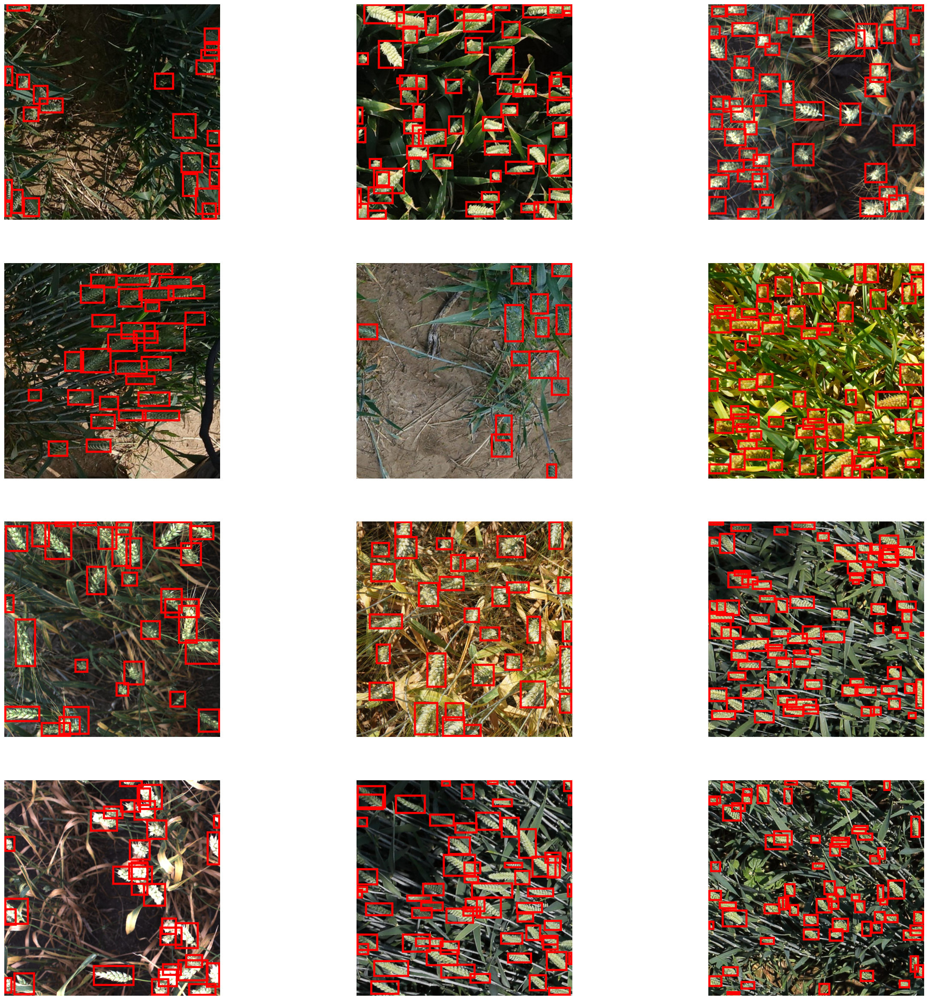

In [27]:
display_images_with_box(12)

# 🚅 Train with YOLOv5

In [29]:
model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO("../input/roi-mammography416-yolov8/ROI Mammography 416/yolov8n.pt")  # load a pretrained model


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [30]:
!wandb off
model.train(data='dataset.yaml', epochs=EPOCHS, imgsz=IMG_SIZE, batch=BATCH_SIZE, save_period=1, cls=7)

W&B offline. Running your script from this directory will only write metadata locally. Use wandb disabled to completely turn off W&B.


Ultralytics YOLOv8.0.110 🚀 Python-3.10.10 torch-2.0.0 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=../input/roi-mammography416-yolov8/ROI Mammography 416/yolov8n.pt, data=dataset.yaml, epochs=100, patience=50, batch=16, imgsz=1024, save=True, save_period=1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False,

# 📝 Prediction

In [35]:
TEST_PATH = 'dataset/images/test'

In [36]:
MODEL_PATH = 'runs/detect/train/weights/best.pt'

In [37]:
model = YOLO(MODEL_PATH)

In [38]:
model.predict(source=TEST_PATH, imgsz=IMG_SIZE, conf=0.5, iou=0.6, save_txt=True, save_conf=True);


image 1/10 /kaggle/working/dataset/images/test/2fd875eaa.jpg: 1024x1024 24 opacitys, 13.1ms
image 2/10 /kaggle/working/dataset/images/test/348a992bb.jpg: 1024x1024 30 opacitys, 13.2ms
image 3/10 /kaggle/working/dataset/images/test/51b3e36ab.jpg: 1024x1024 23 opacitys, 13.1ms
image 4/10 /kaggle/working/dataset/images/test/51f1be19e.jpg: 1024x1024 15 opacitys, 13.1ms
image 5/10 /kaggle/working/dataset/images/test/53f253011.jpg: 1024x1024 28 opacitys, 13.1ms
image 6/10 /kaggle/working/dataset/images/test/796707dd7.jpg: 1024x1024 19 opacitys, 13.1ms
image 7/10 /kaggle/working/dataset/images/test/aac893a91.jpg: 1024x1024 20 opacitys, 13.2ms
image 8/10 /kaggle/working/dataset/images/test/cb8d261a3.jpg: 1024x1024 22 opacitys, 13.2ms
image 9/10 /kaggle/working/dataset/images/test/cc3532ff6.jpg: 1024x1024 20 opacitys, 13.1ms
image 10/10 /kaggle/working/dataset/images/test/f5a1f0358.jpg: 1024x1024 25 opacitys, 13.2ms
Speed: 4.4ms preprocess, 13.1ms inference, 2.3ms postprocess per image at shap

In [39]:
%cd ../../../
%cd kaggle/working/

/
/kaggle/working


In [40]:
PRED_PATH = 'runs/detect/predict/labels'
!ls {PRED_PATH}

2fd875eaa.txt  51b3e36ab.txt  53f253011.txt  aac893a91.txt  cc3532ff6.txt
348a992bb.txt  51f1be19e.txt  796707dd7.txt  cb8d261a3.txt  f5a1f0358.txt


In [41]:
prediction_files = os.listdir(PRED_PATH)
print('Number of test images predicted as opaque: ', len(prediction_files))

Number of test images predicted as opaque:  10


In [42]:
def display_preds_with_box(num):
    pred = []
    bbox = []
    image_id = []
    k = 1
    plt.figure(figsize=(30,30))
    for i in prediction_files[:num]:
        with open(f'{PRED_PATH}/{i}') as f:
            img = read_image(f'{TEST_PATH}/{i[:-4]}.jpg')
            bbox = []
            for j in f:
                pred = i[:-4] + " " + j[:-1]
                pred = pred.split(" ")
                pred.pop(0)
                pred.pop(0)
                pred.pop(-1)
                pred = [eval(i) for i in pred]
                pred = [i*1024 for i in pred]
                [x, y, w, h] = pred
                [xmin, ymin, xmax, ymax] = [x-w/2, y-h/2, x+w/2, y+h/2]
                pred = [xmin, ymin, xmax, ymax]
                bbox.append(pred)
            bbox = torch.tensor(bbox, dtype=torch.int)
            img = draw_bounding_boxes(img, bbox, width=10,colors=(255,0,0))
            img = torchvision.transforms.ToPILImage()(img)
            plt.subplot(num//3+num%3,3,k)
            k+=1
            plt.imshow(img)
            plt.axis('off')

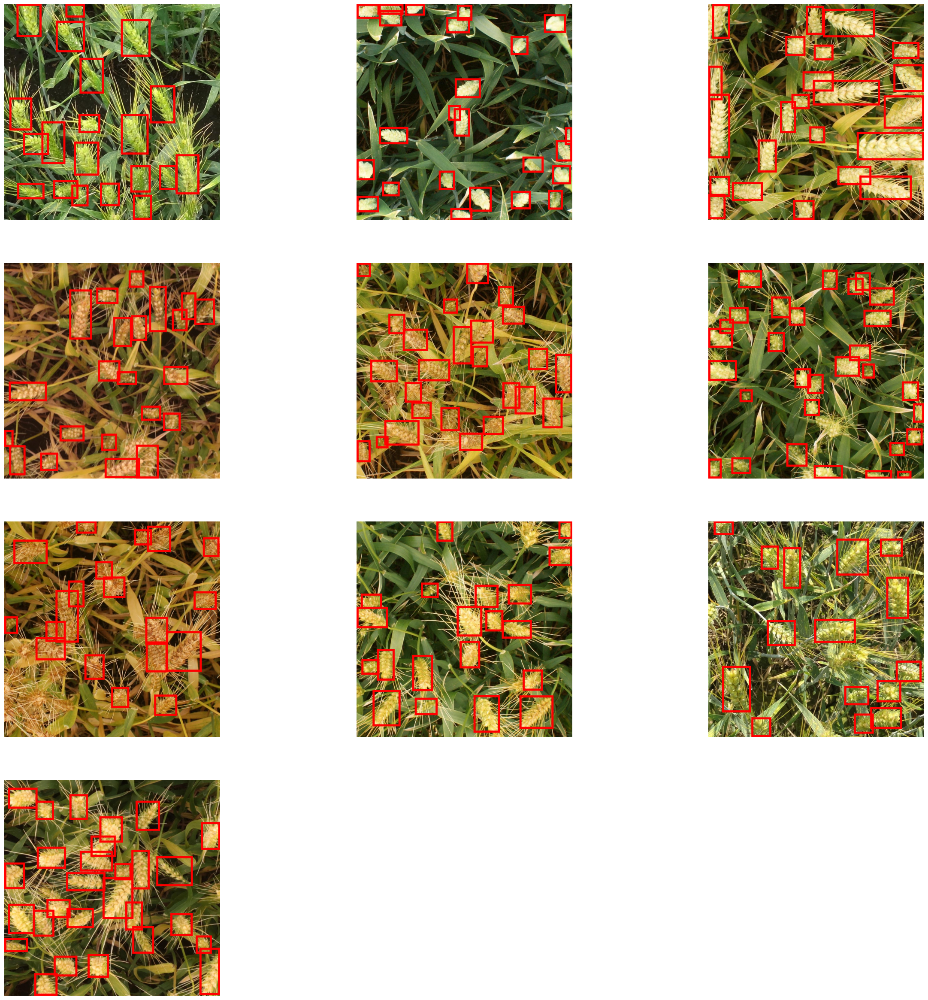

In [43]:
display_preds_with_box(10)